In [ ]:
import torch
import skimage
import matplotlib.pyplot as plt
import numpy as np


from torch.utils.data import DataLoader
from torchvision.datasets import MNIST

from networks.image_fitting import ImageFitting
from networks.siren import Siren
from networks.relu import ReLU
from networks.wire import Wire
from utils.utils import *

Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.


In [2]:
mps_device = torch.device("mps")

In [3]:
skimage.data.brick()

array([[ 99,  98,  99, ..., 166, 160, 150],
       [ 99, 100,  99, ..., 174, 167, 152],
       [ 98,  98,  98, ..., 171, 170, 156],
       ...,
       [ 99,  98, 100, ..., 179, 186, 185],
       [ 98,  98, 101, ..., 182, 185, 182],
       [ 98,  99, 102, ..., 179, 183, 176]], dtype=uint8)

In [4]:
# Load MNIST dataset
mnist_dataset = MNIST(root="./data", train=True, download=True)

# Select an image to plot
image_index = 0
image, label = mnist_dataset[image_index]
image = np.array(image)

In [5]:
image

array([[  0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,
          0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,
          0,   0],
       [  0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,
          0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,
          0,   0],
       [  0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,
          0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,
          0,   0],
       [  0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,
          0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,
          0,   0],
       [  0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,
          0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,
          0,   0],
       [  0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   3,
         18,  18,  18, 126, 136, 175,  26, 166, 255, 247, 127,   0,   0,
          0,   0],
       [  

In [3]:
cameraman = ImageFitting(256, skimage.data.camera())
dataloader = DataLoader(cameraman, batch_size=1, pin_memory=True, num_workers=0)

img_siren = Siren(in_features=2, out_features=1, hidden_features=256, 
                  hidden_layers=3, outermost_linear=True)
img_siren.to(mps_device)

/Users/patrickhaft/opt/anaconda3/envs/NIR/lib/python3.8/site-packages/torch/functional.py:505: UserWarning: torch.meshgrid: in an upcoming release, it will be required to pass the indexing argument. (Triggered internally at /Users/runner/work/_temp/anaconda/conda-bld/pytorch_1685171333734/work/aten/src/ATen/native/TensorShape.cpp:3491.)
  return _VF.meshgrid(tensors, **kwargs)  # type: ignore[attr-defined]


Siren(
  (net): Sequential(
    (0): SineLayer(
      (linear): Linear(in_features=2, out_features=256, bias=True)
    )
    (1): SineLayer(
      (linear): Linear(in_features=256, out_features=256, bias=True)
    )
    (2): SineLayer(
      (linear): Linear(in_features=256, out_features=256, bias=True)
    )
    (3): SineLayer(
      (linear): Linear(in_features=256, out_features=256, bias=True)
    )
    (4): SineLayer(
      (linear): Linear(in_features=256, out_features=1, bias=True)
    )
  )
)

input shape
torch.Size([1, 65536, 2])
Step 0, Total loss 0.575694


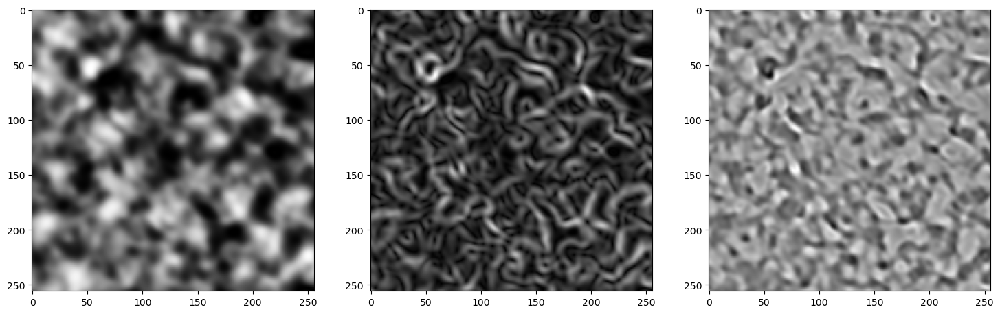

Step 100, Total loss 0.022825


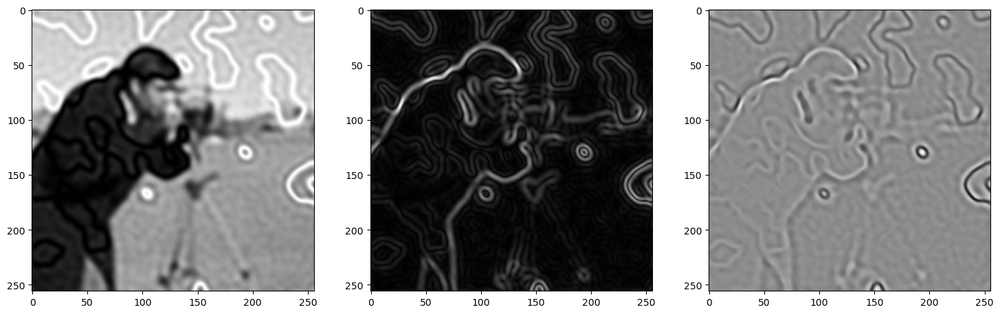

Step 200, Total loss 0.016172


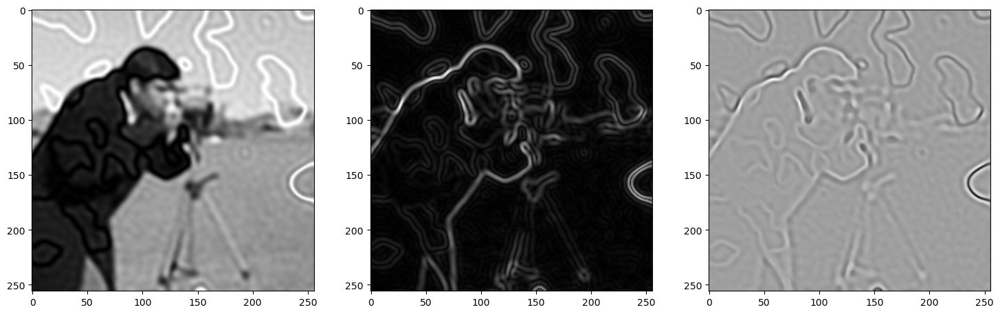

Step 300, Total loss 0.013172


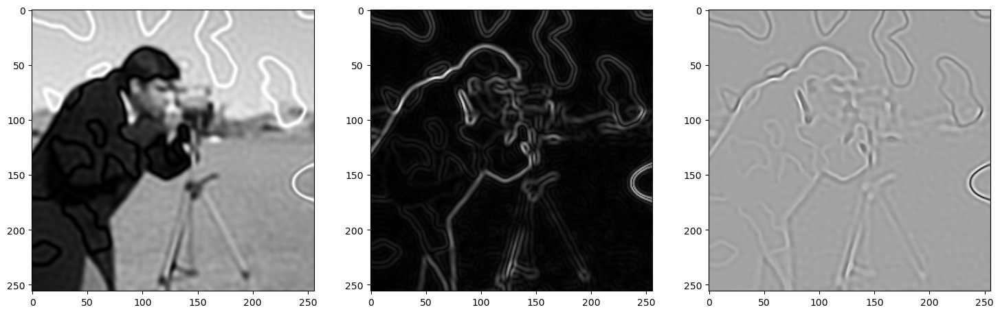

Step 400, Total loss 0.011006


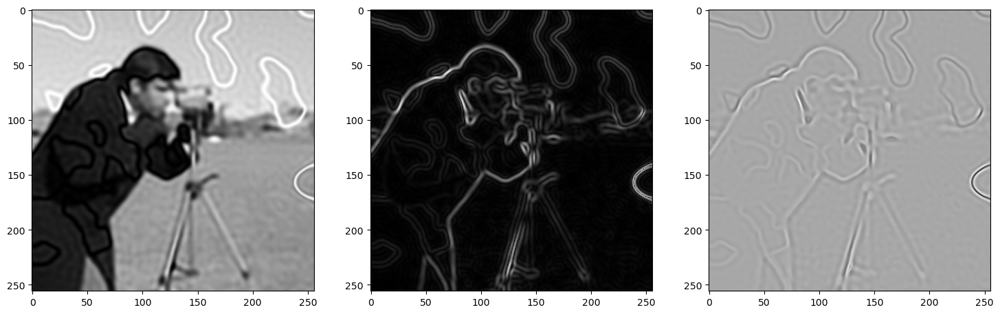

Step 500, Total loss 0.009346


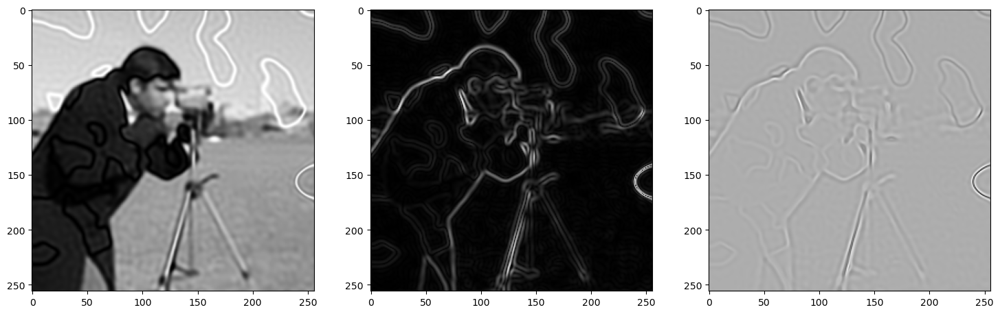

In [4]:
total_steps = 501 # Since the whole image is our dataset, this just means 500 gradient descent steps.
steps_til_summary = 100

optim = torch.optim.Adam(lr=1e-4, params=img_siren.parameters())

model_input, ground_truth = next(iter(dataloader))
model_input, ground_truth = model_input.to(mps_device), ground_truth.to(mps_device)
print("input shape")
print(model_input.shape)
for step in range(total_steps):
    model_output, coords = img_siren(model_input)    
    loss = ((model_output - ground_truth)**2).mean()

    if not step % steps_til_summary:
        print("Step %d, Total loss %0.6f" % (step, loss))
        img_grad = gradient(model_output, coords)
        img_laplacian = laplace(model_output, coords)

        fig, axes = plt.subplots(1,3, figsize=(18,6))
        axes[0].imshow(model_output.cpu().view(256,256).detach().numpy(), cmap='gray')
        axes[1].imshow(img_grad.norm(dim=-1).cpu().view(256,256).detach().numpy(), cmap='gray')
        axes[2].imshow(img_laplacian.cpu().view(256,256).detach().numpy(), cmap='gray')
        plt.show()

    optim.zero_grad()
    loss.backward()
    optim.step()

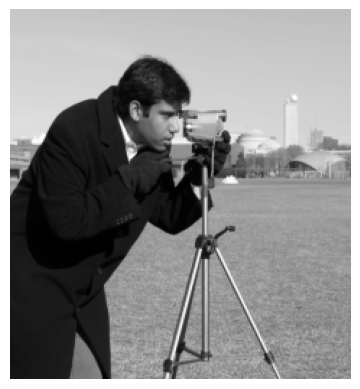

In [11]:
resized_image = skimage.transform.resize(skimage.data.camera(), (256, 236), anti_aliasing=True)
plt.imshow(np.array(resized_image), cmap='gray')
plt.axis('off')
plt.show()

In [3]:
img_fit = ImageFitting(256, skimage.data.camera())
dataloader = DataLoader(img_fit, batch_size=1, pin_memory=True, num_workers=0)

img_relu = ReLU(in_features=2, out_features=1, hidden_features=256, 
                  hidden_layers=3, outermost_linear=True)
img_relu.to(mps_device)

/Users/patrickhaft/opt/anaconda3/envs/NIR/lib/python3.8/site-packages/torch/functional.py:505: UserWarning: torch.meshgrid: in an upcoming release, it will be required to pass the indexing argument. (Triggered internally at /Users/runner/work/_temp/anaconda/conda-bld/pytorch_1685171333734/work/aten/src/ATen/native/TensorShape.cpp:3491.)
  return _VF.meshgrid(tensors, **kwargs)  # type: ignore[attr-defined]


ReLU(
  (net): Sequential(
    (0): ReLULayer(
      (linear): Linear(in_features=2, out_features=256, bias=True)
      (activation): ReLU()
    )
    (1): ReLULayer(
      (linear): Linear(in_features=256, out_features=256, bias=True)
      (activation): ReLU()
    )
    (2): ReLULayer(
      (linear): Linear(in_features=256, out_features=256, bias=True)
      (activation): ReLU()
    )
    (3): ReLULayer(
      (linear): Linear(in_features=256, out_features=256, bias=True)
      (activation): ReLU()
    )
    (4): Linear(in_features=256, out_features=1, bias=True)
  )
)

Step 0, Total loss 0.042044


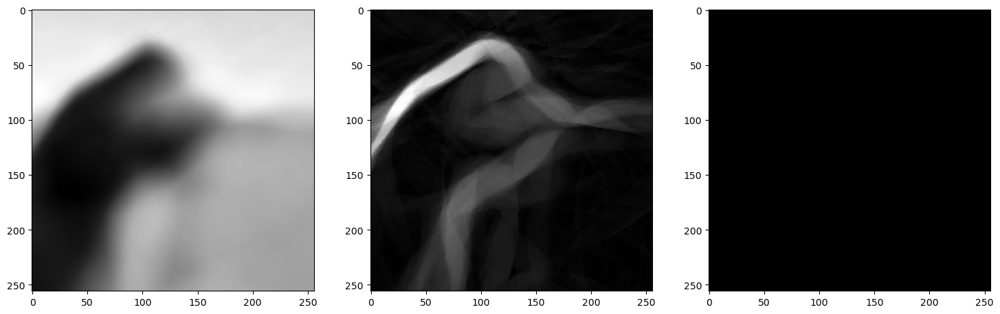

Step 100, Total loss 0.040898


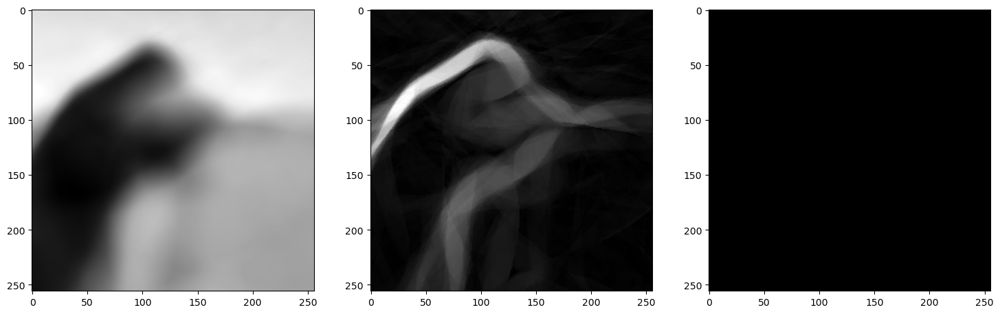

Step 200, Total loss 0.039222


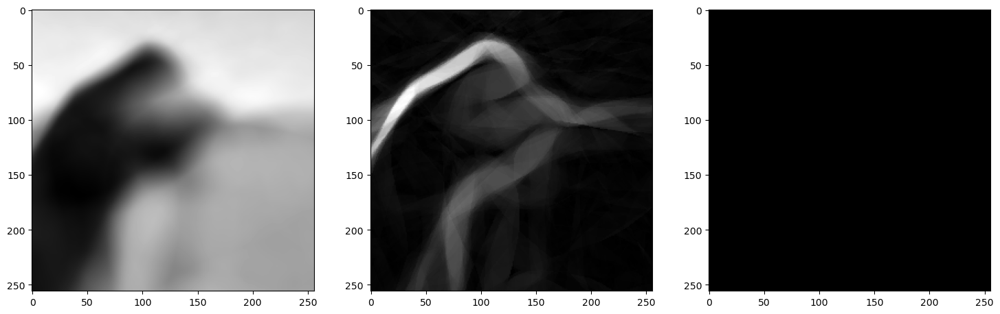

Step 300, Total loss 0.037370


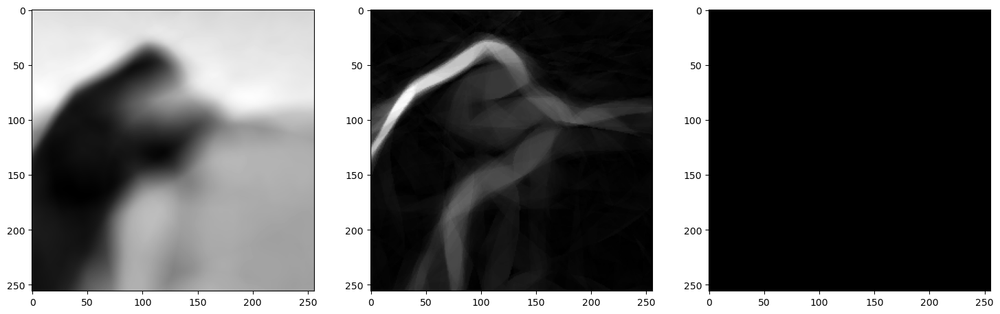

Step 400, Total loss 0.035550


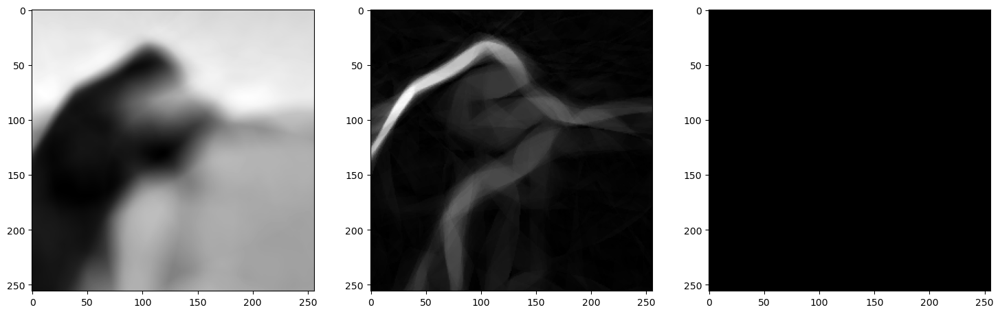

Step 500, Total loss 0.033804


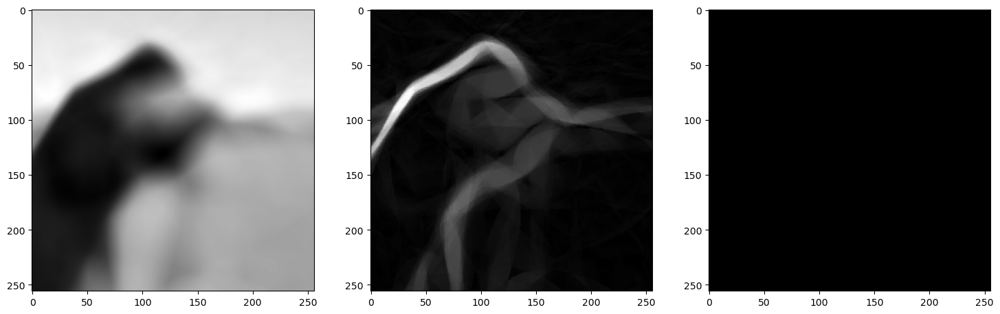

Step 600, Total loss 0.032193


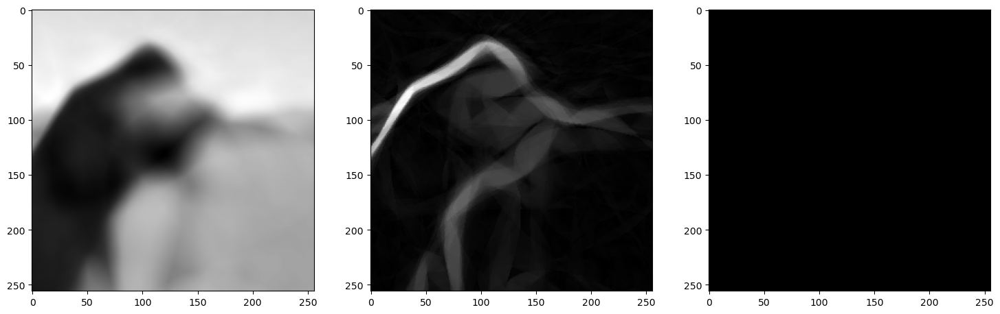

Step 700, Total loss 0.030704


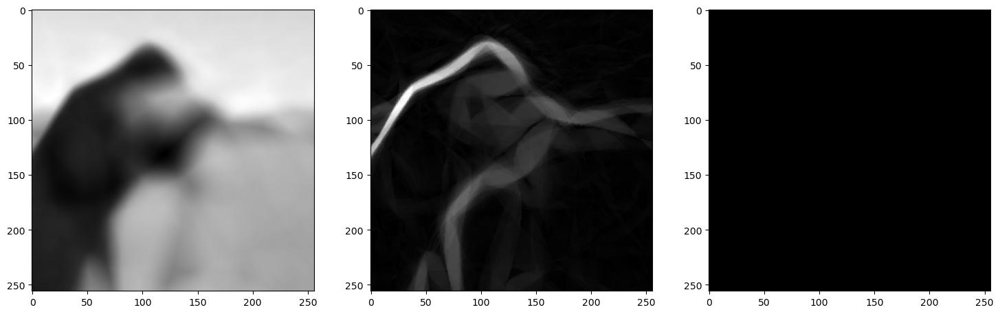

Step 800, Total loss 0.029449


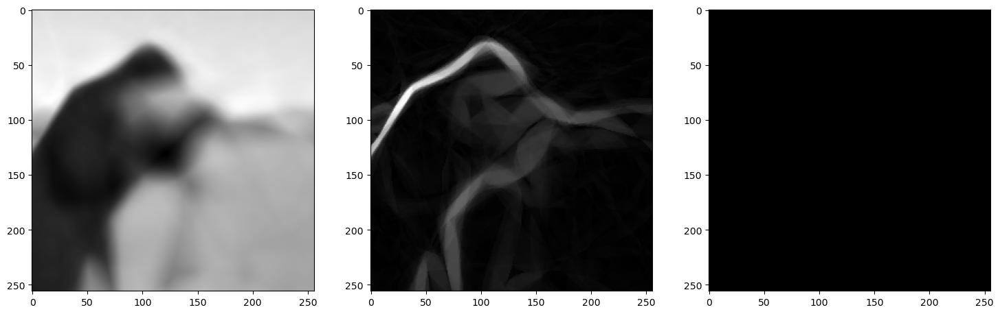

Step 900, Total loss 0.028456


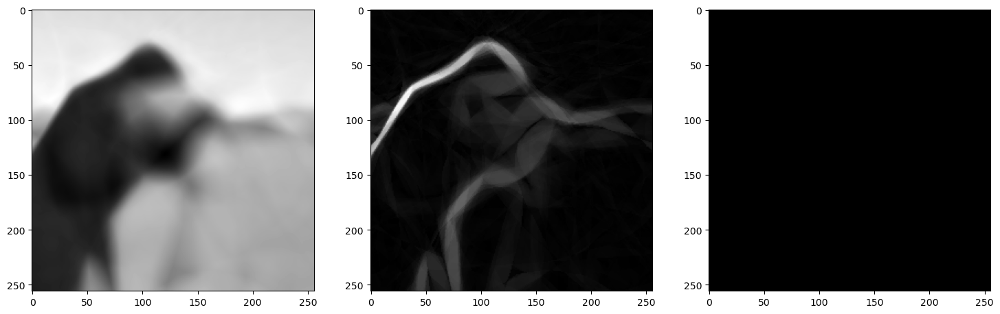

Step 1000, Total loss 0.027513


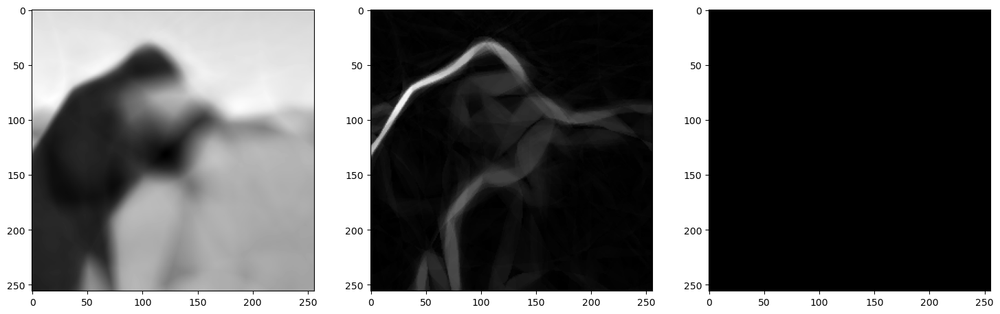

Step 1100, Total loss 0.027169


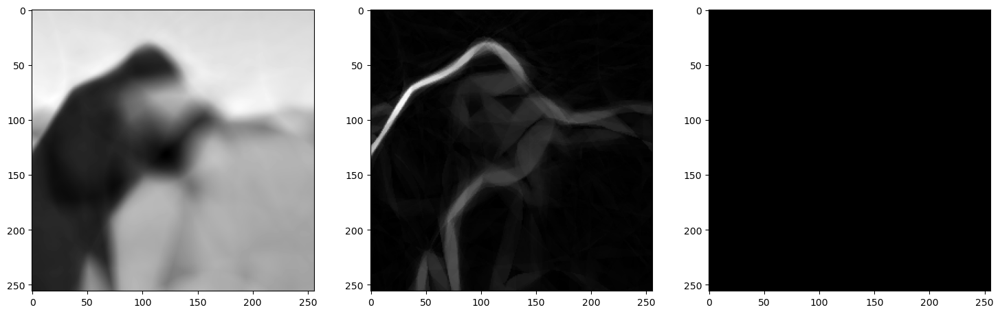

Step 1200, Total loss 0.026726


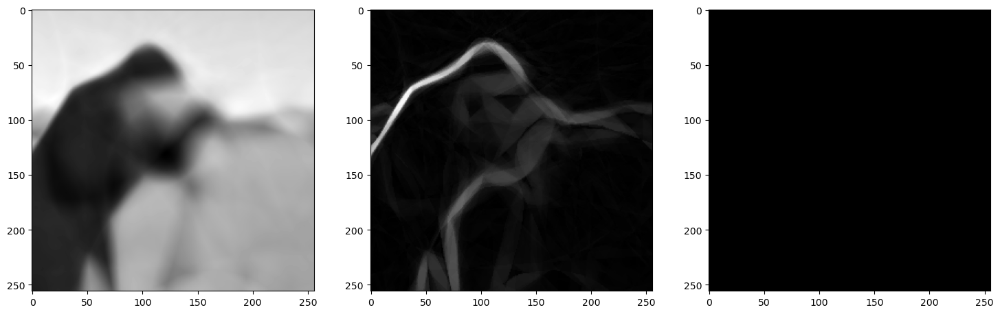

Step 1300, Total loss 0.025816


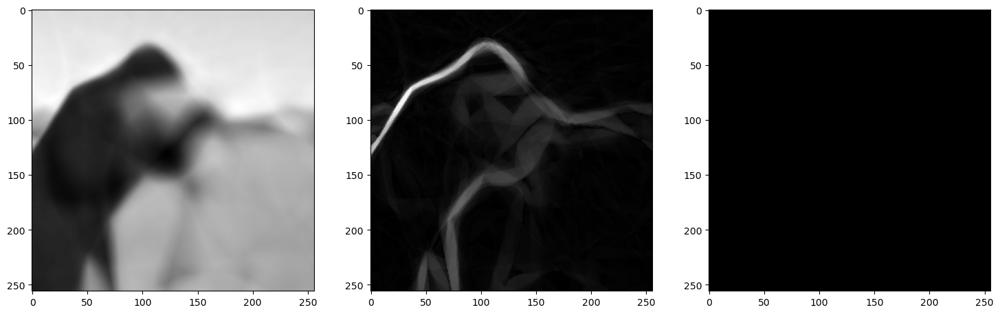

Step 1400, Total loss 0.025079


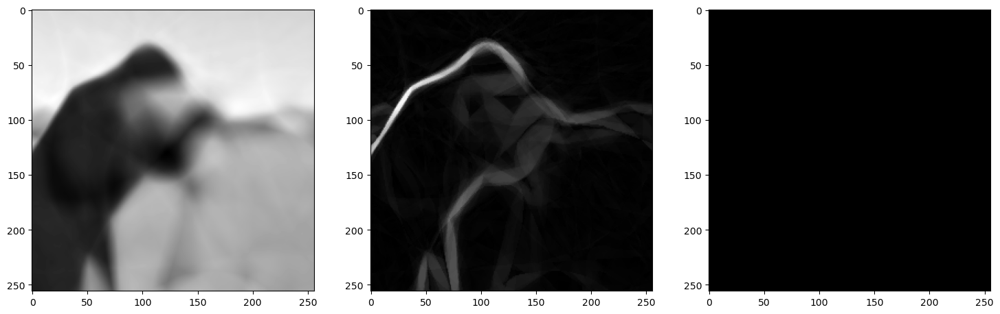

Step 1500, Total loss 0.024583


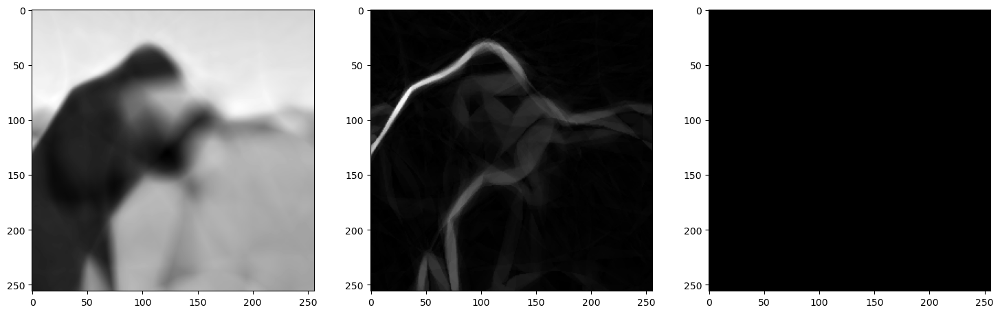

Step 1600, Total loss 0.024158


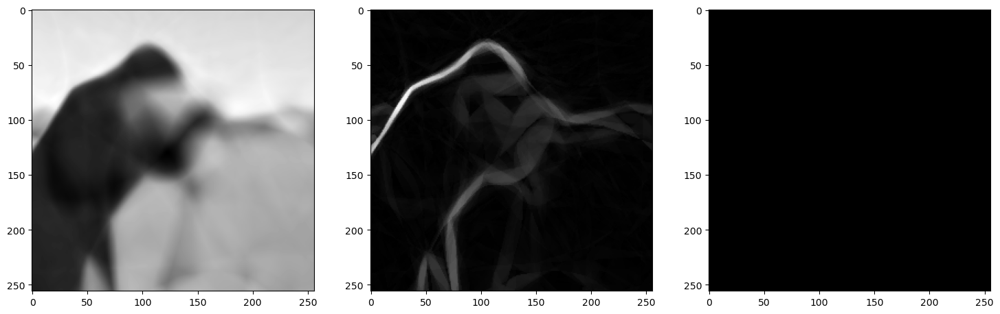

Step 1700, Total loss 0.023787


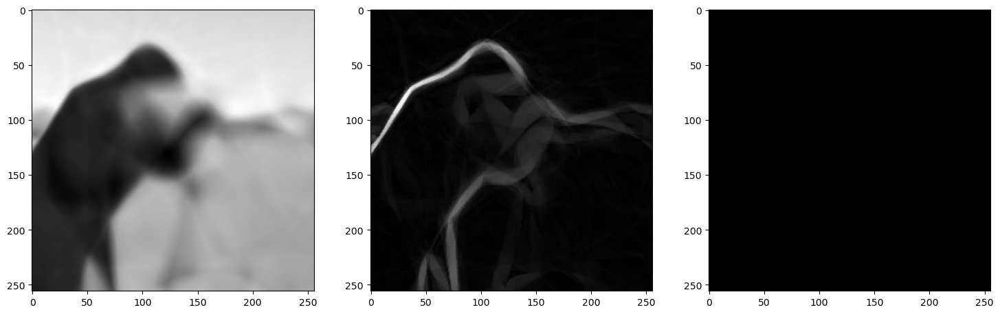

Step 1800, Total loss 0.023382


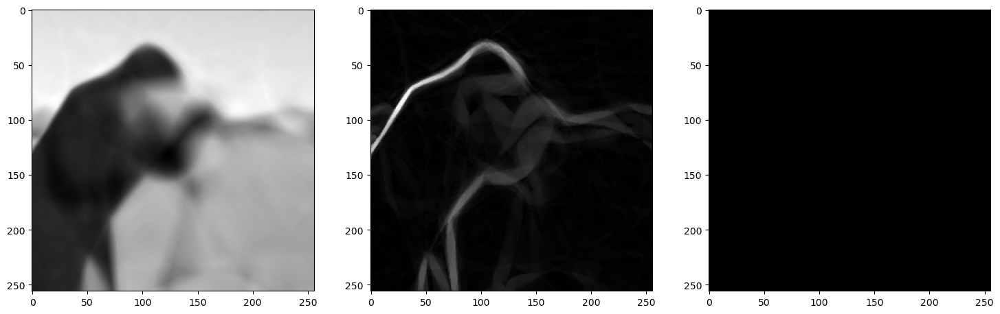

Step 1900, Total loss 0.023050


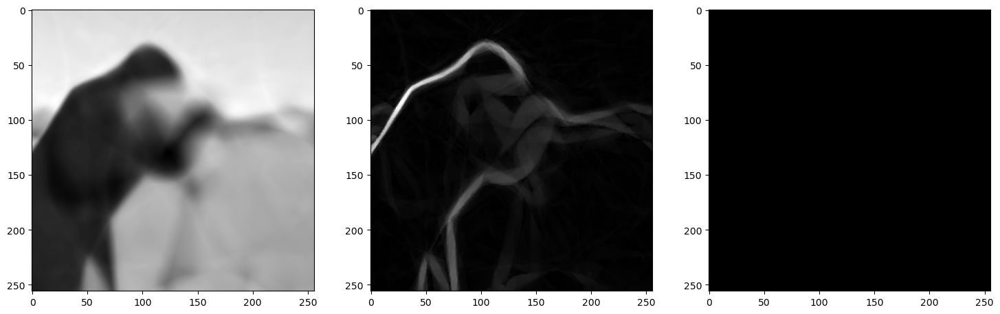

Step 2000, Total loss 0.023262


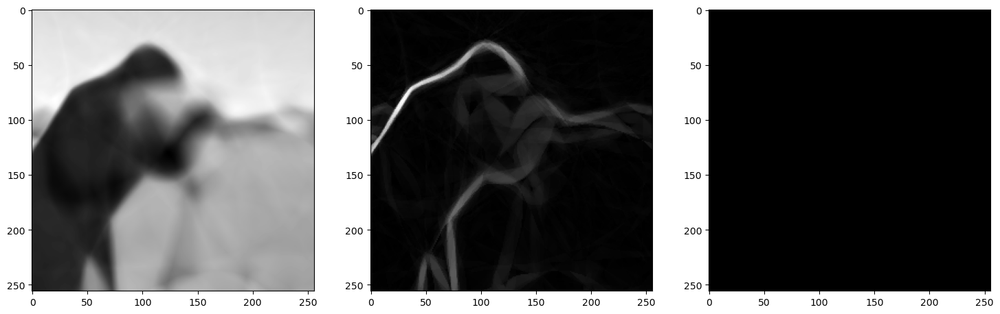

In [5]:
total_steps = 2001 # Since the whole image is our dataset, this just means 500 gradient descent steps.
steps_til_summary = 100

optim = torch.optim.Adam(lr=1e-4, params=img_relu.parameters())

model_input, ground_truth = next(iter(dataloader))
model_input, ground_truth = model_input.to(mps_device), ground_truth.to(mps_device)

for step in range(total_steps):
    model_output, coords = img_relu(model_input)    
    loss = ((model_output - ground_truth)**2).mean()
    
    if not step % steps_til_summary:
        print("Step %d, Total loss %0.6f" % (step, loss))
        img_grad = gradient(model_output, coords)
        img_laplacian = laplace(model_output, coords)

        fig, axes = plt.subplots(1,3, figsize=(18,6))
        axes[0].imshow(model_output.cpu().view(256,256).detach().numpy(), cmap='gray')
        axes[1].imshow(img_grad.norm(dim=-1).cpu().view(256,256).detach().numpy(), cmap='gray')
        axes[2].imshow(img_laplacian.cpu().view(256,256).detach().numpy(), cmap='gray')
        plt.show()

    optim.zero_grad()
    loss.backward()
    optim.step()

In [7]:
img_fit = ImageFitting(256, skimage.data.camera())
dataloader = DataLoader(img_fit, batch_size=1, pin_memory=True, num_workers=0)

img_wire = Wire(in_features=2, out_features=1, hidden_features=256, 
                  hidden_layers=3, outermost_linear=True)

img_wire.to(mps_device)

Wire(
  (net): Sequential(
    (0): WireLayer(
      (linear): Linear(in_features=2, out_features=256, bias=True)
    )
    (1): WireLayer(
      (linear): Linear(in_features=256, out_features=256, bias=True)
    )
    (2): WireLayer(
      (linear): Linear(in_features=256, out_features=256, bias=True)
    )
    (3): WireLayer(
      (linear): Linear(in_features=256, out_features=256, bias=True)
    )
    (4): Linear(in_features=256, out_features=1, bias=True)
  )
)

Step 0, Total loss 0.322201


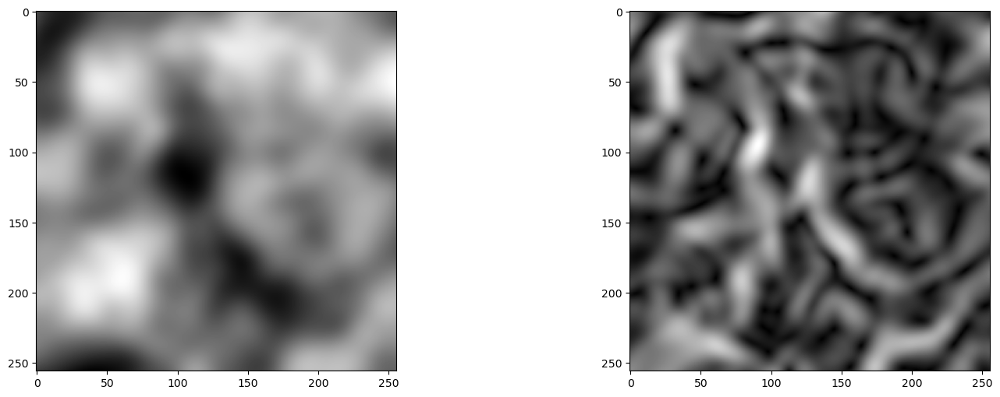

Step 100, Total loss 0.009381


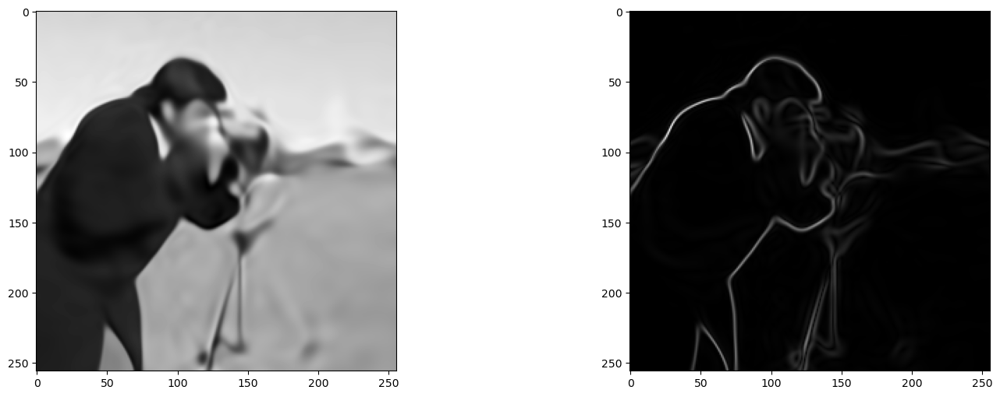

Step 200, Total loss 0.005554


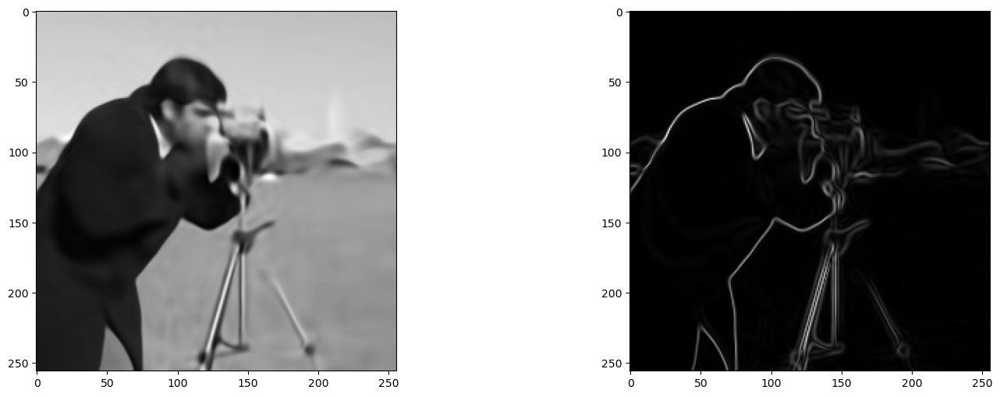

Step 300, Total loss 0.004817


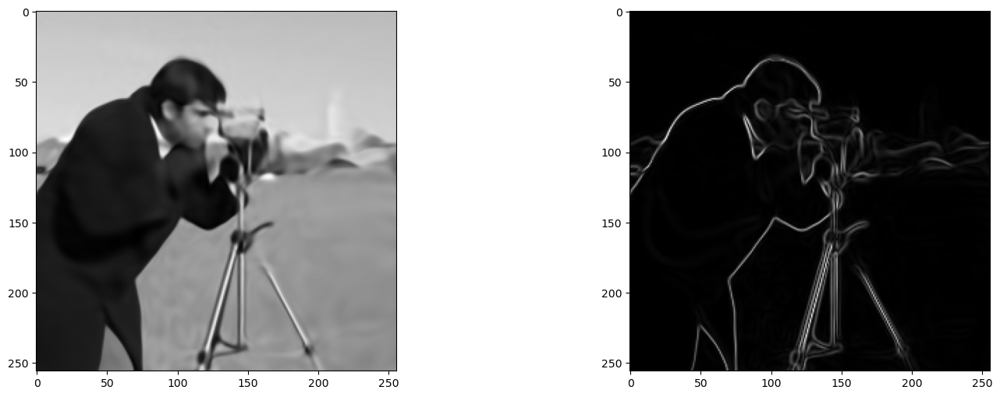

Step 400, Total loss 0.002573


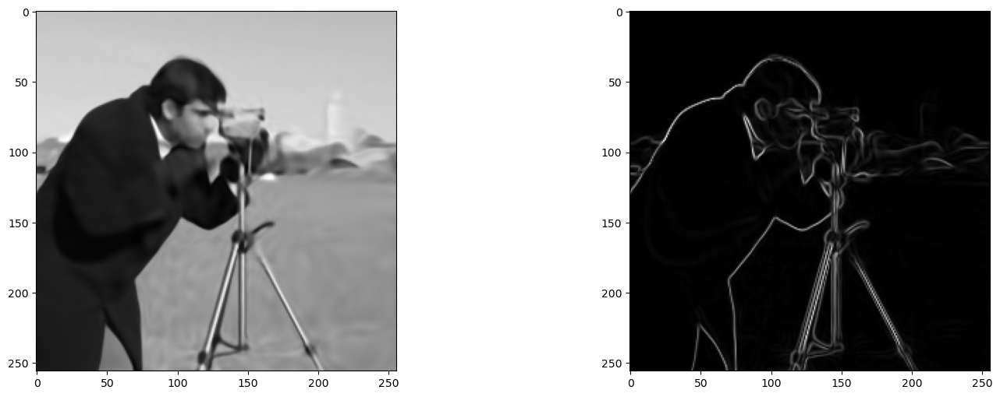

Step 500, Total loss 0.002181


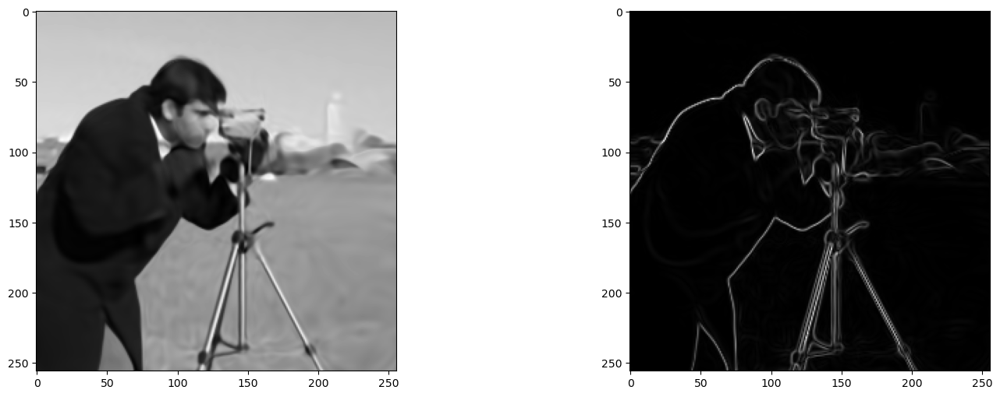

Step 600, Total loss 0.001831


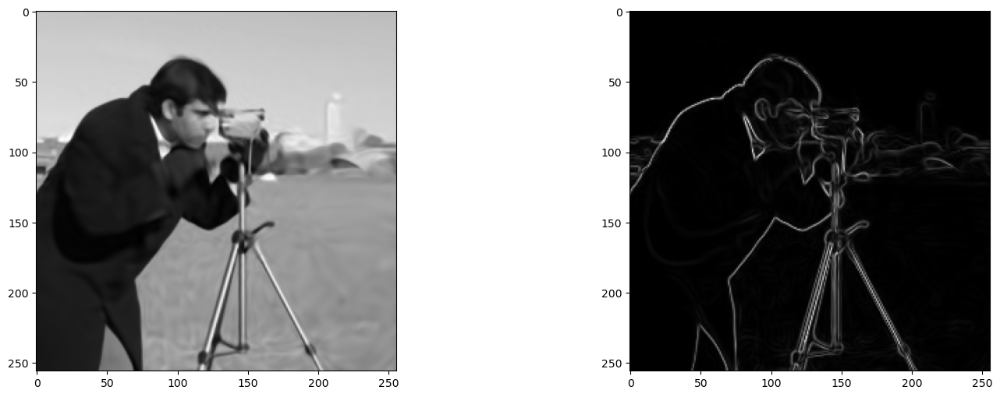

Step 700, Total loss 0.001500


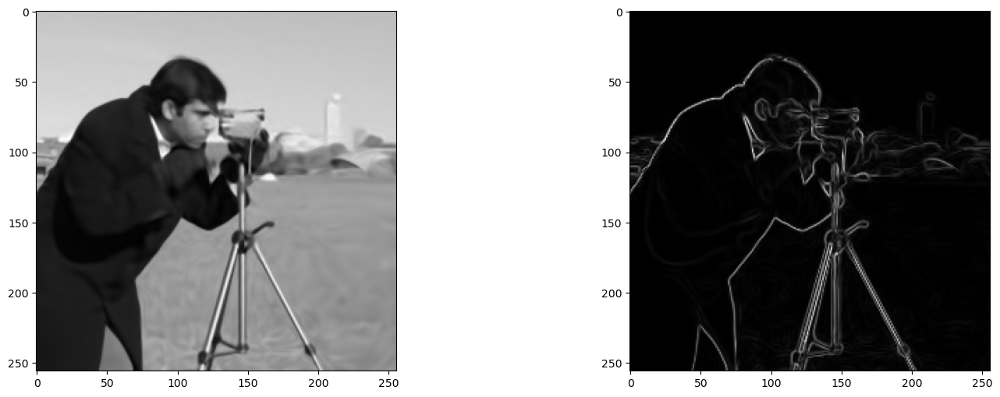

Step 800, Total loss 0.001354


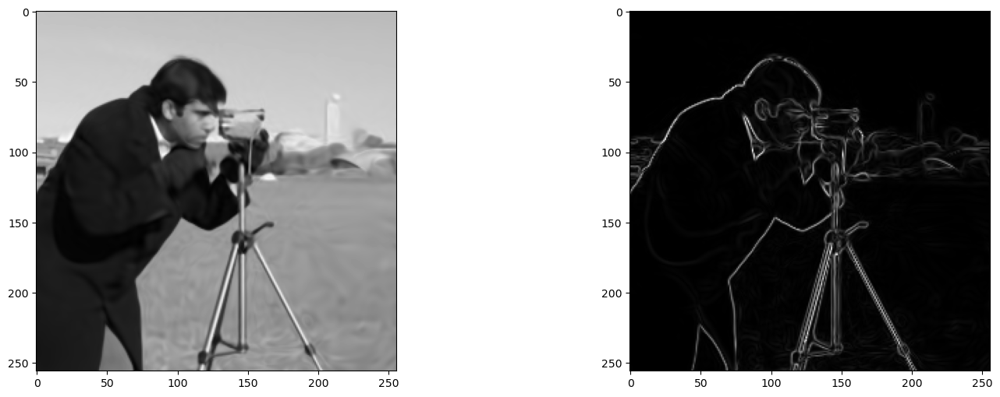

Step 900, Total loss 0.001264


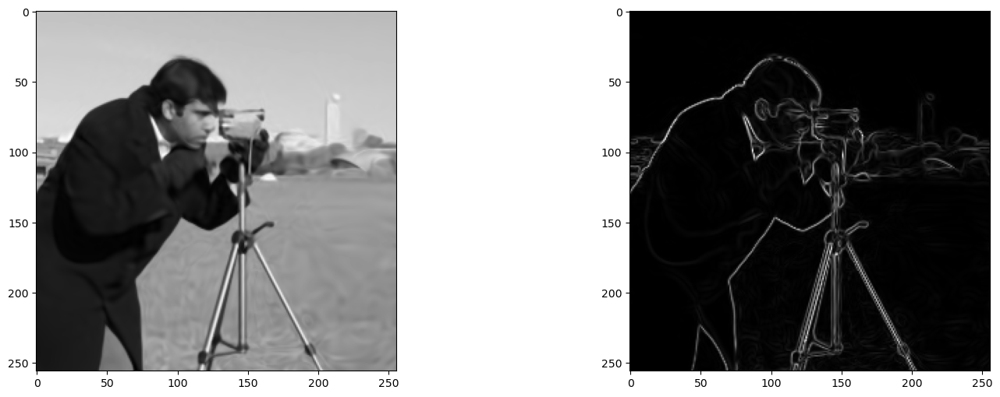

Step 1000, Total loss 0.002213


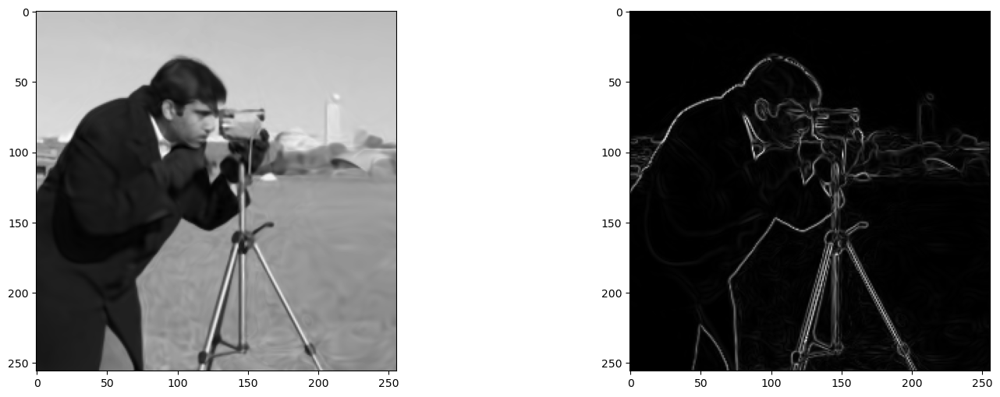

Step 1100, Total loss 0.001377


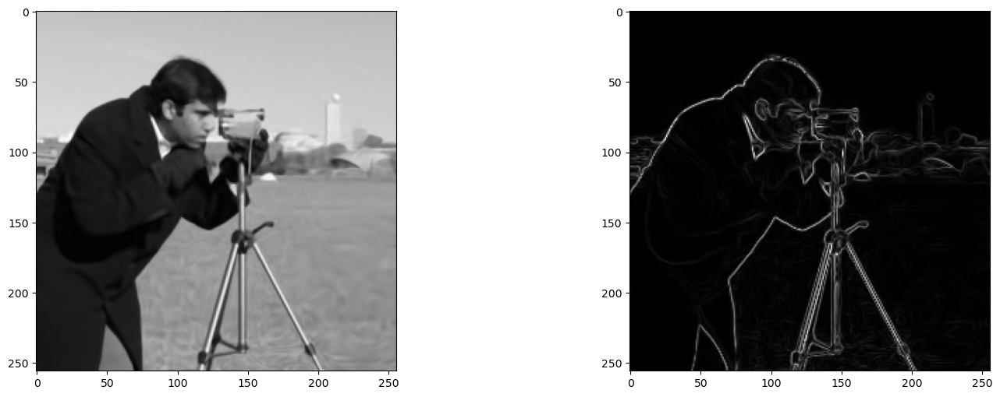

Step 1200, Total loss 0.000999


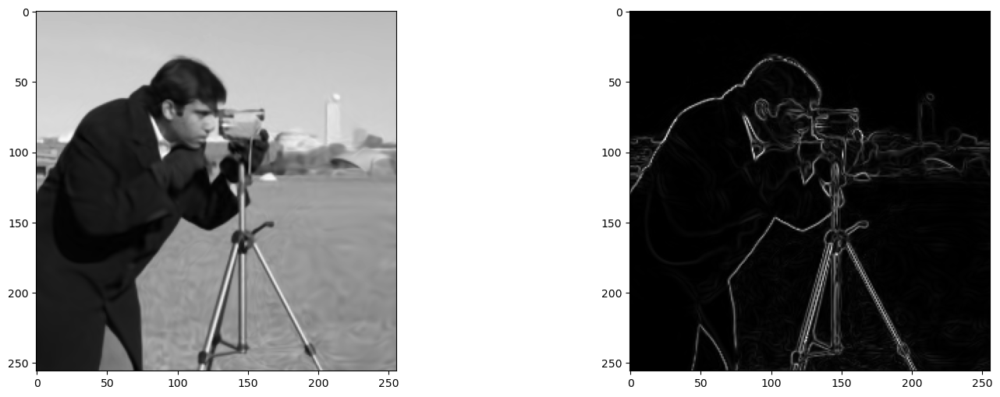

Step 1300, Total loss 0.000995


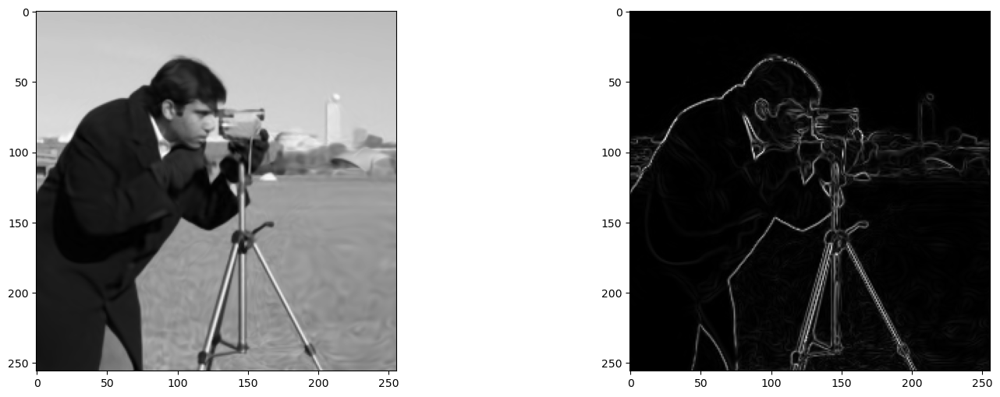

Step 1400, Total loss 0.000852


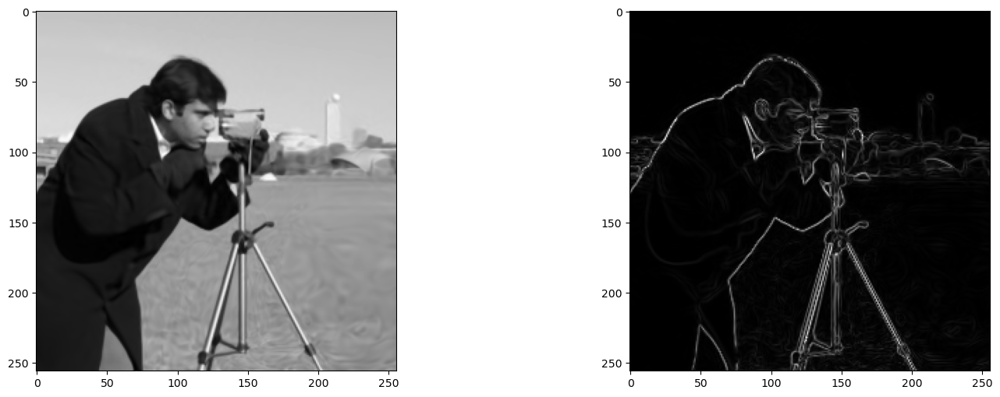

Step 1500, Total loss 0.001168


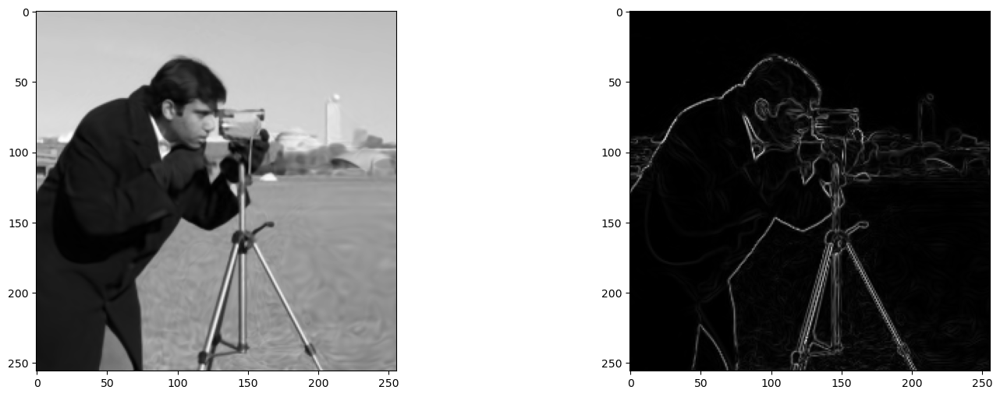

Step 1600, Total loss 0.000885


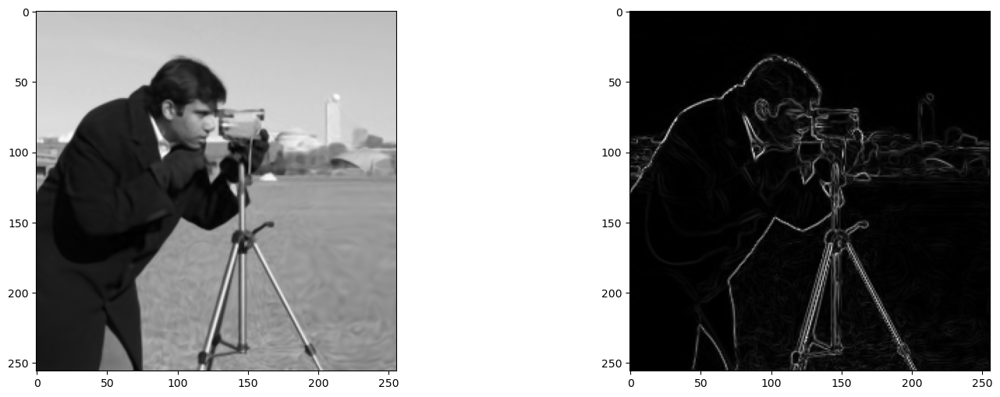

Step 1700, Total loss 0.000737


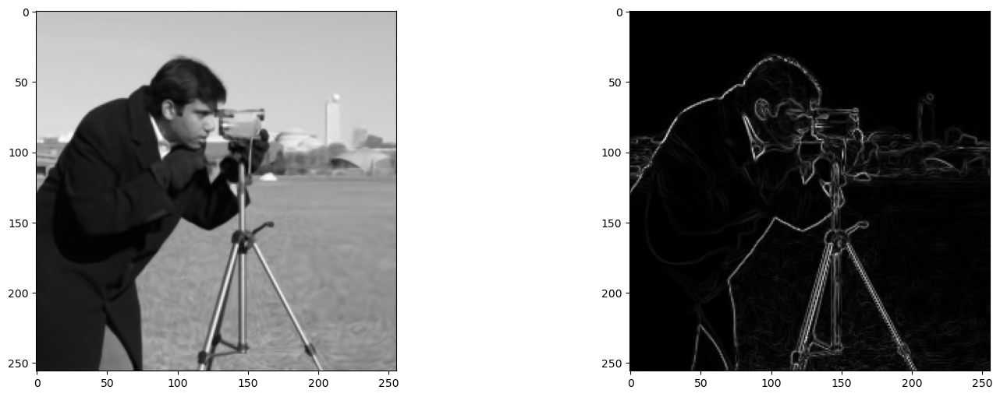

Step 1800, Total loss 0.002287


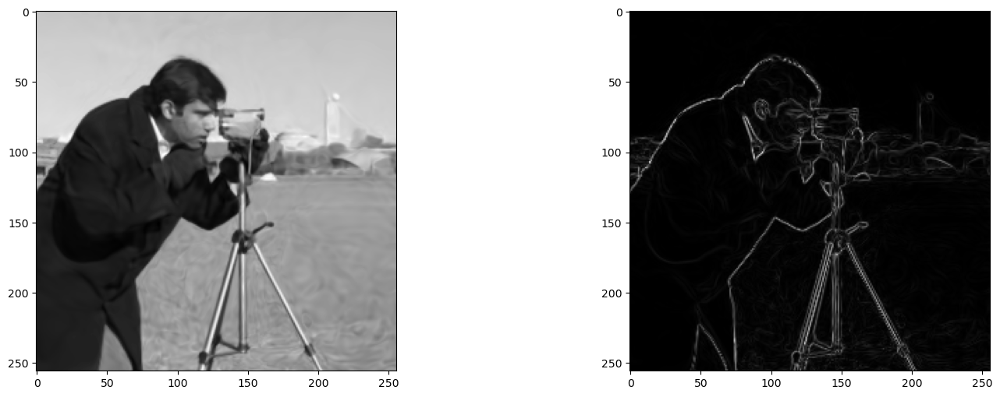

Step 1900, Total loss 0.000937


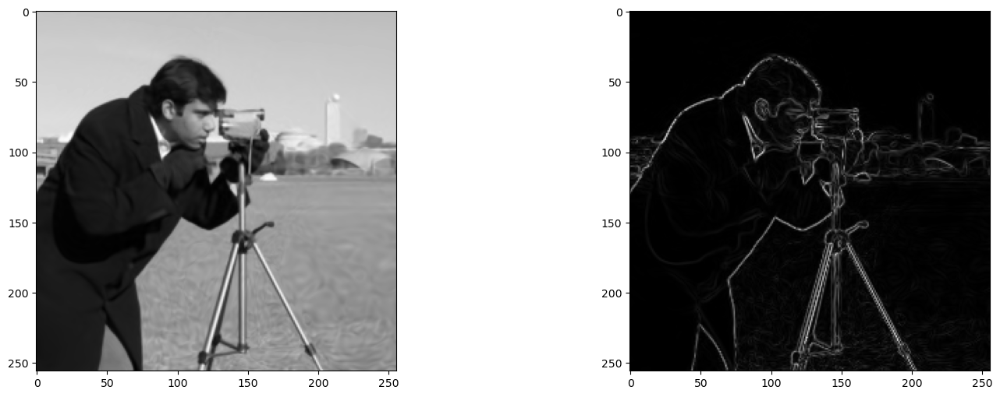

Step 2000, Total loss 0.000668


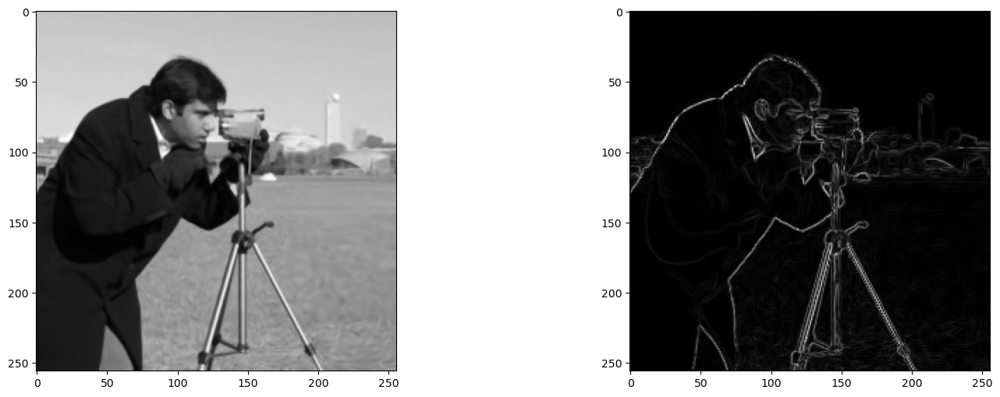

In [8]:
total_steps = 2001 # Since the whole image is our dataset, this just means 500 gradient descent steps.
steps_til_summary = 100

optim = torch.optim.Adam(lr=1e-3, params=img_wire.parameters())

model_input, ground_truth = next(iter(dataloader))
model_input, ground_truth = model_input.to(mps_device), ground_truth.to(mps_device)

for step in range(total_steps):
    model_output, coords = img_wire(model_input)    
    loss = ((model_output - ground_truth)**2).mean()
    
    if not step % steps_til_summary:
        print("Step %d, Total loss %0.6f" % (step, loss))
        img_grad = gradient(model_output, coords)
        #img_laplacian = laplace(model_output, coords)

        fig, axes = plt.subplots(1,2, figsize=(18,6))
        axes[0].imshow(model_output.cpu().view(256,256).detach().numpy(), cmap='gray')
        axes[1].imshow(img_grad.norm(dim=-1).cpu().view(256,256).detach().numpy(), cmap='gray')
        #axes[2].imshow(img_laplacian.cpu().view(256,256).detach().numpy(), cmap='gray')
        plt.show()

    optim.zero_grad()
    loss.backward()
    optim.step()